#                                                Quora Data Challenge

## Challenge:
Suppose you are a Data Scientist on the Mobile team at Quora. The team has just introduced a new UI design to the Quora app. The goal of the new design is to increase user engagement (measured by minutes spent on site). The team ran an A/B test to evaluate the change. Using the data, help the team understand the impact of the UI change better.

Tables provided are as follows:
    1. t1_user_active_min.csv
    2. t2_user_variant.csv
    3. t3_user_active_min_pre.csv
    4. t4_user_attributes.csv

### Importing the default libraries

In [215]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import sys
from datetime import timedelta

#Installing pandas_profiling (for a quick EDA)
!{sys.executable} -m pip install pandas_profiling

In [7]:
import pandas_profiling

In [12]:
#Reading the input CSV files
t1_user_min = pd.read_csv('t1_user_active_min.csv',parse_dates=['dt'])
t2_user_var = pd.read_csv('t2_user_variant.csv',parse_dates=['dt','signup_date'])
t3_user_min_pre = pd.read_csv('t3_user_active_min_pre.csv',parse_dates=['dt'])
t4_user_atrib = pd.read_csv('t4_user_attributes.csv')

In [14]:
print(t1_user_min.shape,'\n',t2_user_var.shape,'\n',t3_user_min_pre.shape,'\n',t4_user_atrib.shape)

(1066402, 3) 
 (50000, 4) 
 (1190093, 3) 
 (50000, 3)


### Checking the head of the imported datasets

In [15]:
t1_user_min.head()

,uid,dt,active_mins
0,0,2019-02-22,5.0
1,0,2019-03-11,5.0
2,0,2019-03-18,3.0
3,0,2019-03-22,4.0
4,0,2019-04-03,9.0


In [16]:
t2_user_var.head()

,uid,variant_number,dt,signup_date
0,0,0,2019-02-06,2018-09-24
1,1,0,2019-02-06,2016-11-07
2,2,0,2019-02-06,2018-09-17
3,3,0,2019-02-06,2018-03-04
4,4,0,2019-02-06,2017-03-09


In [17]:
t3_user_min_pre.head()

,uid,dt,active_mins
0,0,2018-09-24,3.0
1,0,2018-11-08,4.0
2,0,2018-11-24,3.0
3,0,2018-11-28,6.0
4,0,2018-12-02,6.0


In [18]:
t4_user_atrib.head()

,uid,gender,user_type
0,0,male,non_reader
1,1,male,reader
2,2,male,non_reader
3,3,male,non_reader
4,4,male,non_reader


### Profiling the imported datasets for a quick overview

In [22]:
pandas_profiling.ProfileReport(t1_user_min)

In [23]:
pandas_profiling.ProfileReport(t2_user_var)

### Merging active minutes spent during the experiment with the user variant table

In [223]:
user_act_min_tc = t1_user_min.merge(t2_user_var, on = 'uid', how = 'left')

In [30]:
user_act_min_tc.head()

,uid,dt_x,active_mins,variant_number,dt_y,signup_date
0,0,2019-02-22,5.0,0,2019-02-06,2018-09-24
1,0,2019-03-11,5.0,0,2019-02-06,2018-09-24
2,0,2019-03-18,3.0,0,2019-02-06,2018-09-24
3,0,2019-03-22,4.0,0,2019-02-06,2018-09-24
4,0,2019-04-03,9.0,0,2019-02-06,2018-09-24


In [224]:
user_act_min_tc = user_act_min_tc.rename({'dt_x':'dt', 'dt_y':'start_dt'}, axis=1)

In [225]:
user_act_min_tc.head()

,uid,dt,active_mins,variant_number,start_dt,signup_date
0,0,2019-02-22,5.0,0,2019-02-06,2018-09-24
1,0,2019-03-11,5.0,0,2019-02-06,2018-09-24
2,0,2019-03-18,3.0,0,2019-02-06,2018-09-24
3,0,2019-03-22,4.0,0,2019-02-06,2018-09-24
4,0,2019-04-03,9.0,0,2019-02-06,2018-09-24


In [226]:
user_act_min_tc.shape

(1066402, 6)

### Checking for variation in mean and std at a user and day level

In [54]:
user_act_min_tc.groupby('variant_number').active_mins.agg(['mean','median','std'])

,mean,median,std
variant_number,,,
0,35.344199,5.0,1265.733184
1,40.240408,7.0,1293.703072


Looks like the standrd deviation between the test and control groups is comparable (though the deviation as seen here is clearly affected by outliers

### Calculating the total active minutes at a user level

In [50]:
user_act_min_per_user = user_act_min_tc.groupby(['variant_number','uid']).active_mins.agg(
    {'tot_min':'sum','tot_days':'count'}).reset_index()

In [51]:
user_act_min_per_user.head()

,variant_number,uid,tot_min,tot_days
0,0,0,43.0,13
1,0,1,15205.0,95
2,0,2,17.0,7
3,0,3,77.0,24
4,0,4,39.0,20


### Checking for variation in mean and std at a user level

In [55]:
user_act_min_per_user.groupby('variant_number').tot_min.agg(['mean','median','std'])

,mean,median,std
variant_number,,,
0,837.642886,52.0,15022.032864
1,784.202867,71.0,10213.608365


At a user level, there is a lot of variation in the standard deviation(and so variance) between the two groups. This might also be indicative of the presence of outliers in the data

### Splitting the merged data into test and control groups

In [56]:
user_act_min_t = user_act_min_tc[user_act_min_tc.variant_number == 1]
user_act_min_c = user_act_min_tc[user_act_min_tc.variant_number == 0]

In [58]:
 print(user_act_min_t.shape,'\n',user_act_min_c.shape)

(179445, 6) 
 (886957, 6)


In [67]:
user_act_min_t.describe()

,uid,active_mins,variant_number
count,179445.000000,179445.000000,179445.0
mean,45031.472228,40.240408,1.0
std,2886.854392,1293.703072,0.0
min,40000.000000,1.000000,1.0
25%,42536.000000,3.000000,1.0
50%,45038.000000,7.000000,1.0
75%,47586.000000,19.000000,1.0
max,49999.000000,99999.000000,1.0


In [68]:
user_act_min_c.describe()

,uid,active_mins,variant_number
count,886957.000000,886957.000000,886957.0
mean,20010.716644,35.344199,0.0
std,11597.547674,1265.733184,0.0
min,0.000000,1.000000,0.0
25%,9955.000000,2.000000,0.0
50%,19971.000000,5.000000,0.0
75%,30120.000000,16.000000,0.0
max,39999.000000,99999.000000,0.0


Looks like 99999 is an anomaly in the data

#### Dropping records where active mins = 99999 (While outliers are generally defined as the points above 3SD, for the purpose of t-test and not to lose out on information, just removing the max value which is a clear anomaly)

In [227]:
user_act_min_t = user_act_min_t[user_act_min_t.active_mins !=99999]
user_act_min_c = user_act_min_c[user_act_min_c.active_mins !=99999]
user_act_min_tc = user_act_min_tc[user_act_min_tc.active_mins !=99999]

In [228]:
 print(user_act_min_tc.shape,'\n', user_act_min_t.shape,'\n',user_act_min_c.shape)

(1066230, 6) 
 (179415, 6) 
 (886815, 6)


In [229]:
user_act_min_tc.groupby('variant_number').active_mins.agg(['mean','median','std'])

,mean,median,std
variant_number,,,
0,19.337660,5.0,44.797631
1,23.526294,7.0,54.191356


#### The data captures only minutes for the days when the users were active. Expanding the data to have user records for each day of the experiment

In [128]:
user_act_min_t_pvt = user_act_min_t.pivot_table(values= 'active_mins',columns='dt',
                                                index=['variant_number','uid','start_dt','signup_date'],
                                                fill_value=0).reset_index()
user_act_min_t_f = user_act_min_t_pvt.melt(id_vars=['variant_number','uid','start_dt','signup_date'],
                                           var_name='dt',value_name='active_mins')
print(user_act_min_t_f.head())
print(user_act_min_t_f.shape)

   variant_number    uid   start_dt signup_date         dt  active_mins
0               1  40000 2019-02-06  2019-02-04 2019-02-06            0
1               1  40001 2019-02-06  2017-04-29 2019-02-06            0
2               1  40002 2019-02-06  2015-08-22 2019-02-06            0
3               1  40004 2019-02-06  2015-04-12 2019-02-06            0
4               1  40005 2019-02-06  2017-03-05 2019-02-06            0
(1381200, 6)


In [130]:
user_act_min_c_pvt = user_act_min_c.pivot_table(values= 'active_mins',columns='dt',
                                                index=['variant_number','uid','start_dt','signup_date'],
                                                fill_value=0).reset_index()
user_act_min_c_f = user_act_min_c_pvt.melt(id_vars=['variant_number','uid','start_dt','signup_date'],
                                           var_name='dt',value_name='active_mins')
print(user_act_min_c_f.head())
print(user_act_min_c_f.shape)

   variant_number  uid   start_dt signup_date         dt  active_mins
0               0    0 2019-02-06  2018-09-24 2019-02-06            0
1               0    1 2019-02-06  2016-11-07 2019-02-06            0
2               0    2 2019-02-06  2018-09-17 2019-02-06            0
3               0    3 2019-02-06  2018-03-04 2019-02-06            0
4               0    4 2019-02-06  2017-03-09 2019-02-06            0
(5613750, 6)


### Calculating the mean time spent per user per day for the variant and the control

In [179]:
variant_mean = user_act_min_t_f.active_mins.mean()
variant_std = user_act_min_t_f.active_mins.std()
variant_var = user_act_min_t_f.active_mins.var()
variant_cnt = user_act_min_t_f.active_mins.count()
print('%.4f %.2f %.2f %.2f' %(variant_mean,variant_std,variant_var, variant_cnt))

3.0560 21.07 444.03 1381200.00


In [180]:
control_mean = user_act_min_c_f.active_mins.mean()
control_std = user_act_min_c_f.active_mins.std()
control_var = user_act_min_c_f.active_mins.var()
control_cnt = user_act_min_c_f.active_mins.count()
print('%.4f %.2f %.2f %.2f' %(control_mean,control_std,control_var, control_cnt))

3.0548 19.15 366.76 5613750.00


### Using Welch t test to identify the p-value

In [178]:
from scipy import stats
from scipy.stats import ttest_ind_from_stats
from statsmodels.stats.power import TTestIndPower

In [151]:
ttest_ind_from_stats(mean1=variant_mean,std1=variant_std,nobs1=variant_cnt,
                    mean2=control_mean,std2=control_std,nobs2=control_cnt,
                    equal_var=False)

Ttest_indResult(statistic=0.06145955015857426, pvalue=0.9509932339796476)

The pvalue is quite high and so there is small to no evidence against the null hypothesis

### Calculating the confidence interval

In [176]:
#Defining a function
def get_ci(test_mean, cont_mean,test_std,cont_std,test_size, cont_size, ci):
    sd = np.sqrt((test_std * test_std) / test_size + (cont_std * cont_std) / cont_size)
    lift = test_mean - cont_mean
    val = stats.norm.isf((1 - ci) / 2)
    lwr_bnd = lift - val * sd
    upr_bnd = lift + val * sd
    return((round(lwr_bnd,2), round(upr_bnd,2)))

In [177]:
get_ci(variant_mean,control_mean,variant_std,control_std,variant_cnt,control_cnt,0.95)

(-0.04, 0.04)

### Analyzing pre -experiment data

In [202]:
pandas_profiling.ProfileReport(t3_user_min_pre)

In [203]:
t3_user_min_pre.head()

,uid,dt,active_mins
0,0,2018-09-24,3.0
1,0,2018-11-08,4.0
2,0,2018-11-24,3.0
3,0,2018-11-28,6.0
4,0,2018-12-02,6.0


In [205]:
user_act_min_tc_pre = t3_user_min_pre.merge(t2_user_var, on = 'uid', how = 'left')

In [206]:
user_act_min_tc_pre = user_act_min_tc_pre.rename({'dt_x':'dt', 'dt_y':'start_dt'}, axis=1)

In [231]:
user_act_min_tc_pre.head()

,uid,dt,active_mins,variant_number,start_dt,signup_date
0,0,2018-09-24,3.0,0,2019-02-06,2018-09-24
1,0,2018-11-08,4.0,0,2019-02-06,2018-09-24
2,0,2018-11-24,3.0,0,2019-02-06,2018-09-24
3,0,2018-11-28,6.0,0,2019-02-06,2018-09-24
4,0,2018-12-02,6.0,0,2019-02-06,2018-09-24


In [209]:
user_act_min_tc_pre.groupby('variant_number',as_index=False).agg(
    {'uid':['count',pd.Series.nunique],'active_mins':['sum','mean','median','std']})

variant_number     uid         active_mins                               
                   count nunique         sum       mean median          std
0              0  989489   39776  35099241.0  35.472088    5.0  1276.028338
1              1  200604    9921   3225503.0  16.078957    4.0   500.199145

In [211]:
user_act_min_tc_pre = user_act_min_tc_pre[user_act_min_tc_pre.active_mins !=99999]

In [212]:
user_act_min_tc_pre.shape

(1189927, 6)

### Considering only 150 days of data since the experiment data is for 150 days

In [219]:
user_act_min_tc_pre = user_act_min_tc_pre[user_act_min_tc_pre.dt > user_act_min_tc_pre.dt.max()- timedelta(days=150) ]

In [233]:
user_act_min_tc_pre.dt.nunique()

150

In [221]:
user_act_min_tc_pre.groupby('variant_number',as_index=False).agg(
    {'uid':['count',pd.Series.nunique],'active_mins':['sum','mean','median','std']})

variant_number     uid         active_mins                             
                   count nunique         sum       mean median        std
0              0  852115   39757  16320899.0  19.153399    5.0  45.365537
1              1  172374    9918   2334800.0  13.544966    4.0  32.091151

In [230]:
user_act_min_tc.groupby('variant_number',as_index=False).agg(
    {'uid':['count',pd.Series.nunique],'active_mins':['sum','mean','median','std']})

variant_number     uid         active_mins                             
                   count nunique         sum       mean median        std
0              0  886815   37425  17148927.0  19.337660    5.0  44.797631
1              1  179415    9208   4220970.0  23.526294    7.0  54.191356

Looking at the above two results, the mean active minutes spent has increased by a fair number for the variants during the experimental phase whereas it has remained the same for the control group

In order to compare pre vs post for the test and the control group, we also need to consider only users who signed up atleast 150 days prior to the experiment start dt .i.e 6th Feb 2019

In [258]:
exp_dt = t2_user_var.dt.max()
cut_off_dt = exp_dt - timedelta(days=150)
cut_off_dt

Timestamp('2018-09-09 00:00:00')

In [323]:
user_act_min_tc_new = user_act_min_tc[user_act_min_tc.signup_date <= cut_off_dt ]

In [325]:
user_act_min_tc_new.shape

(914189, 6)

In [324]:
user_act_min_tc_pre_new = user_act_min_tc_pre[user_act_min_tc_pre.signup_date <= cut_off_dt ]

In [326]:
user_act_min_tc_pre_new.shape

(923767, 6)

In [279]:
user_act_min_tc_new.groupby('variant_number').uid.agg(['count',pd.Series.nunique])

,count,nunique
variant_number,,
0,761511,28478
1,152678,6818


In [280]:
user_act_min_tc_pre_new.groupby('variant_number').uid.agg(['count',pd.Series.nunique])

,count,nunique
variant_number,,
0,768838,29217
1,154929,7020


In [361]:
user_list_pre_post = list(user_act_min_tc_pre_new.drop_duplicates('uid')[['uid']].
                          merge(user_act_min_tc_new.drop_duplicates('uid')[['uid']],on ='uid',how ='inner').uid.unique())

In [363]:
len(user_list_pre_post)

35263

In [364]:
user_act_min_tc_pre_new = user_act_min_tc_pre_new[user_act_min_tc_pre_new.uid.isin(user_list_pre_post)]

In [366]:
user_act_min_tc_pre_new.shape

(916683, 6)

In [367]:
user_act_min_tc_new = user_act_min_tc_new[user_act_min_tc_new.uid.isin(user_list_pre_post)]

In [368]:
user_act_min_tc_new.shape

(914047, 6)

In [369]:
user_act_min_tc_pre_new.groupby('variant_number',as_index=False).agg(
    {'uid':['count',pd.Series.nunique],'active_mins':['sum','mean','median','std']})

variant_number     uid         active_mins                             
                   count nunique         sum       mean median        std
0              0  763034   28450  15224364.0  19.952406    5.0  46.442219
1              1  153649    6813   2167280.0  14.105396    4.0  32.651963

In [370]:
user_act_min_tc_new.groupby('variant_number',as_index=False).agg(
    {'uid':['count',pd.Series.nunique],'active_mins':['sum','mean','median','std']})

variant_number     uid         active_mins                             
                   count nunique         sum       mean median        std
0              0  761380   28450  15351221.0  20.162364    5.0  45.940006
1              1  152667    6813   3745426.0  24.533305    7.0  54.938579

### Looking at the line plots of test and control groups before and during the experiment

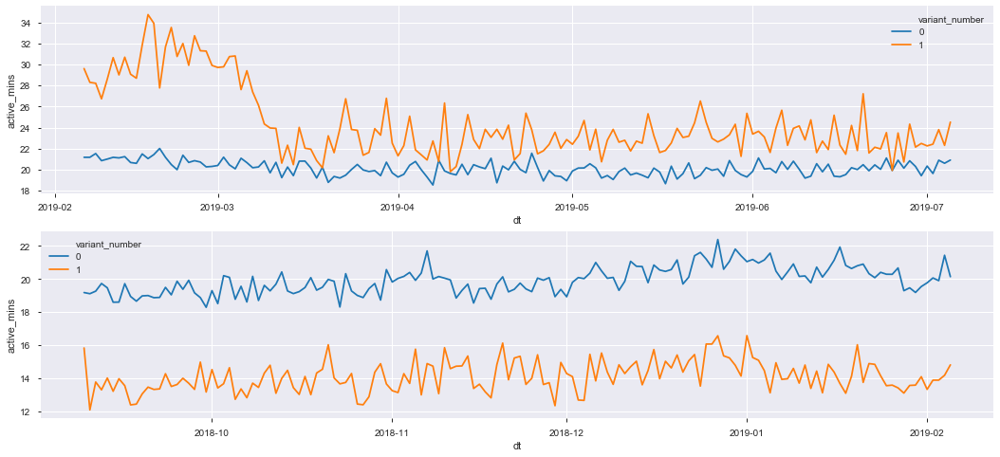

In [595]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
sns.lineplot(data=user_act_min_tc_new.groupby(['variant_number','dt'],as_index=False).active_mins.mean(), 
             x='dt',y='active_mins',hue='variant_number')
plt.subplot(2,1,2)
sns.lineplot(data=user_act_min_tc_pre_new.groupby(['variant_number','dt'],as_index=False).active_mins.mean(), 
             x='dt',y='active_mins',hue='variant_number')

Looking at the two line series charts, it is clear that the average time spent on Quora has flipped between the test and the control groups during the experiment. It might be an indicator that the design had an effect on the test group. This data however is not at a user-date level as the majority of users are not active on most of the days, so we will now expand the data to fill in the non-active days, so that the average calculation is consistent

In [388]:
user_act_min_tc_pre_new_pvt = user_act_min_tc_pre_new.pivot_table(values= 'active_mins',columns='dt',
                                                index=['variant_number','uid','start_dt','signup_date'],
                                                fill_value=0).reset_index()
user_act_min_tc_pre_new_f = user_act_min_tc_pre_new_pvt.melt(id_vars=['variant_number','uid','start_dt','signup_date'],
                                           var_name='dt',value_name='active_mins')
print(user_act_min_tc_pre_new_f.head())
print(user_act_min_tc_pre_new_f.shape)

   variant_number  uid   start_dt signup_date         dt  active_mins
0               0    1 2019-02-06  2016-11-07 2018-09-09          371
1               0    3 2019-02-06  2018-03-04 2018-09-09            0
2               0    4 2019-02-06  2017-03-09 2018-09-09            1
3               0    5 2019-02-06  2018-06-25 2018-09-09            0
4               0    6 2019-02-06  2017-01-22 2018-09-09            0
(5289450, 6)


In [390]:
user_act_min_tc_new_pvt = user_act_min_tc_new.pivot_table(values= 'active_mins',columns='dt',
                                                index=['variant_number','uid','start_dt','signup_date'],
                                                fill_value=0).reset_index()
user_act_min_tc_new_f = user_act_min_tc_new_pvt.melt(id_vars=['variant_number','uid','start_dt','signup_date'],
                                           var_name='dt',value_name='active_mins')
print(user_act_min_tc_new_f.head())
print(user_act_min_tc_new_f.shape)

   variant_number  uid   start_dt signup_date         dt  active_mins
0               0    1 2019-02-06  2016-11-07 2019-02-06            0
1               0    3 2019-02-06  2018-03-04 2019-02-06            0
2               0    4 2019-02-06  2017-03-09 2019-02-06            0
3               0    5 2019-02-06  2018-06-25 2019-02-06            0
4               0    6 2019-02-06  2017-01-22 2019-02-06            0
(5289450, 6)


### Looking at the trend now post filling in for inactive days

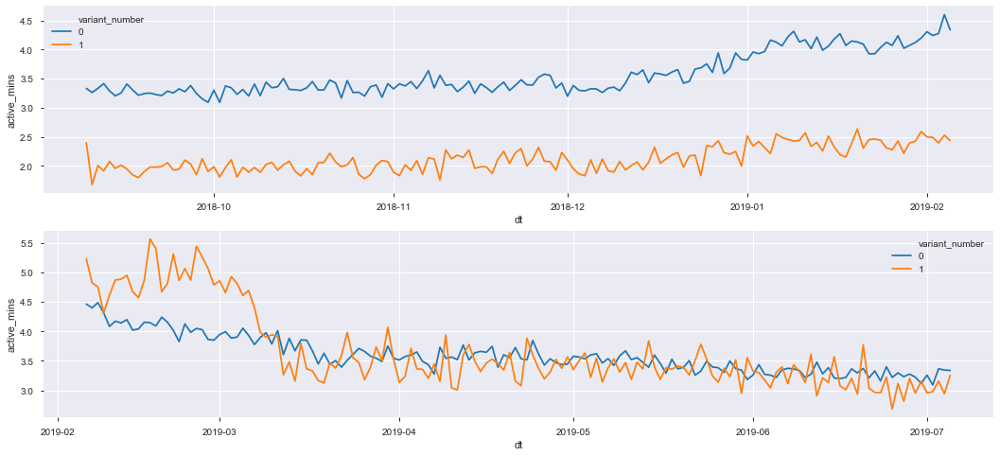

In [594]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
sns.lineplot(data=user_act_min_tc_pre_new_f.groupby(['variant_number','dt'],as_index=False).active_mins.mean(), 
             x='dt',y='active_mins',hue='variant_number')
plt.subplot(2,1,2)
sns.lineplot(data=user_act_min_tc_new_f.groupby(['variant_number','dt'],as_index=False).active_mins.mean(), 
             x='dt',y='active_mins',hue='variant_number')

Comparing pre vs.post, there is a similar trend exhibited by both test and control. However, an interesting observation is that there is a sudden spike in the month of February for the test group, when the experiment started.The spike is then followed by a drop and then the trend between the groups evens out, with the average time in the test group slightly lesser than that of the control 

In [393]:
user_act_min_t_new_f = user_act_min_tc_new_f[user_act_min_tc_new_f.variant_number == 1]
user_act_min_c_new_f = user_act_min_tc_new_f[user_act_min_tc_new_f.variant_number == 0]

In [396]:
print(' Test size: {} \n Control size: {}' .format(user_act_min_t_new_f.shape,user_act_min_c_new_f.shape))

 Test size: (1021950, 6) 
 Control size: (4267500, 6)


In [397]:
variant_mean_new = user_act_min_t_new_f.active_mins.mean()
variant_std_new = user_act_min_t_new_f.active_mins.std()
variant_var_new = user_act_min_t_new_f.active_mins.var()
variant_cnt_new = user_act_min_t_new_f.active_mins.count()
print('%.4f %.2f %.2f %.2f' %(variant_mean_new,variant_std_new,variant_var_new, variant_cnt_new))

3.6650 22.96 527.37 1021950.00


In [398]:
control_mean_new = user_act_min_c_new_f.active_mins.mean()
control_std_new = user_act_min_c_new_f.active_mins.std()
control_var_new = user_act_min_c_new_f.active_mins.var()
control_cnt_new = user_act_min_c_new_f.active_mins.count()
print('%.4f %.2f %.2f %.2f' %(control_mean_new,control_std_new,control_var_new, control_cnt_new))

3.5972 20.88 436.13 4267500.00


### Using Welch t-test for the updated sample groups (Users who were present in both the experiment and before the experiment)

In [415]:
ttest_ind_from_stats(mean1=variant_mean_new,std1=variant_std_new,nobs1=variant_cnt_new,
                    mean2=control_mean_new,std2=control_std_new,nobs2=control_cnt_new,
                    equal_var=False)

Ttest_indResult(statistic=2.7243687718351812, pvalue=0.0064425297082406855)

Looks like the average treatment effect is now significant between the variant and the control groups

### Calculating the confidence interval for the treatment effect

In [400]:
get_ci(variant_mean_new,control_mean_new,variant_std_new,control_std_new,variant_cnt_new,control_cnt_new,0.95)

(0.02, 0.12)

In [430]:
CI =get_ci(variant_mean_new,control_mean_new,variant_std_new,control_std_new,variant_cnt_new,control_cnt_new,0.95)

### Calculating the statistical power of the test

In [421]:
TTestIndPower().solve_power(effect_size=0.003193,nobs1=4267500,alpha=0.05, ratio=0.25)

0.8388866444495756

The statistical power of the test is ~84%

### Plotting the disribution

In [408]:
from scipy.stats import norm
import matplotlib.mlab as mlab

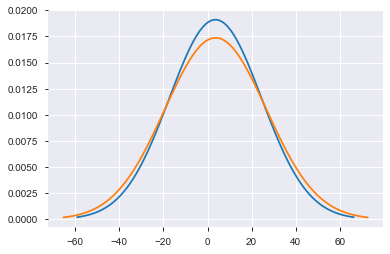

In [424]:
# Create the range of x values 
control_line = np.linspace( control_mean_new - 3 * control_std_new, control_mean_new + 3 * control_std_new , 100)
test_line = np.linspace( variant_mean_new - 3 * variant_std_new,  variant_mean_new + 3 * variant_std_new , 100)

# Plot the distribution 
plt.plot(control_line, norm.pdf(control_line, control_mean_new, control_std_new))
plt.plot(test_line, norm.pdf(test_line,variant_mean_new, variant_std_new))

While the test and the control groups look similar in the distribution, the large sample size indicate the importance of even a small shift in the mean difference

### Plotting the difference of average effect

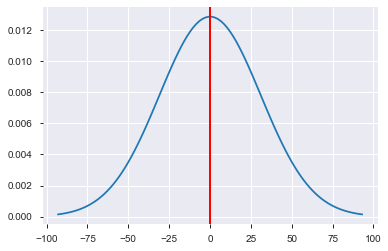

In [442]:
# Find the lift mean and standard deviation
lift_mean = variant_mean_new - control_mean_new
lift_sd = (variant_var_new + control_var_new) ** 0.5

# Generate the range of x-values
lift_line = np.linspace(lift_mean - 3 * lift_sd, lift_mean + 3 * lift_sd, 100)

# Plot the lift distribution
plt.plot(lift_line, norm.pdf(lift_line, lift_mean, lift_sd))

# Add the annotation lines
plt.axvline(x = lift_mean, color = 'green')
plt.axvline(x = CI[0], color = 'red')
plt.axvline(x = CI[1], color = 'red')

In [464]:
t4_user_atrib.head()

,uid,gender,user_type
0,0,male,non_reader
1,1,male,reader
2,2,male,non_reader
3,3,male,non_reader
4,4,male,non_reader


### Merging the attributes table with the variant data

In [476]:
user_tc_atr = t2_user_var.merge(t4_user_atrib, on='uid',how ='left')

In [508]:
user_tc_atr.head()

,uid,variant_number,dt,signup_date,gender,user_type
0,0,0,2019-02-06,2018-09-24,male,non_reader
1,1,0,2019-02-06,2016-11-07,male,reader
2,2,0,2019-02-06,2018-09-17,male,non_reader
3,3,0,2019-02-06,2018-03-04,male,non_reader
4,4,0,2019-02-06,2017-03-09,male,non_reader


### Looking for the split in the assignments across gender and user_type

In [558]:
tc_gdr = user_tc_atr.groupby(['variant_number','gender']).agg({'uid':'count'})
tc_gdr = tc_gdr.groupby(level=0).apply(lambda x:round(x*100/float(x.sum()),2)).reset_index()
tc_gdr.pivot_table(values ='uid',columns = 'variant_number',index='gender').reset_index()

variant_number,gender,0,1
0,female,29.02,28.7
1,male,55.59,55.2
2,unknown,15.39,16.1


From the above table,we can observe that while the proportion of genders across groups are similar, the assignment is not equal between male and female

In [557]:
tc_user_type = user_tc_atr.groupby(['variant_number','user_type']).agg({'uid':'count'})
tc_user_type = tc_user_type.groupby(level=0).apply(lambda x:round(x*100/float(x.sum()),2)).reset_index()
tc_user_type.pivot_table(values ='uid',columns = 'variant_number',index='user_type').reset_index()

variant_number,user_type,0,1
0,contributor,2.29,1.29
1,new_user,9.13,12.35
2,non_reader,71.75,73.67
3,reader,16.83,12.69


From the above table, we can observe that the proportion of user types across groups are somewhat similar,with a significantly high assignment going towards the non_readers. This might be an indicator of why there were not noticeable differences between the test and the control groups

### Merging the attributes table with the experiment data

In [470]:
user_act_min_tc_f = user_act_min_c_f.append(user_act_min_t_f,ignore_index=True)

In [471]:
user_act_min_tc_f.shape

(6994950, 6)

In [468]:
user_act_min_tc_f_atr = user_act_min_tc_f.merge(t4_user_atrib, on='uid',how ='left')

In [473]:
user_act_min_tc_f_atr.head()

,variant_number,uid,start_dt,signup_date,dt,active_mins,gender,user_type
0,0,0,2019-02-06,2018-09-24,2019-02-06,0,male,non_reader
1,0,1,2019-02-06,2016-11-07,2019-02-06,0,male,reader
2,0,2,2019-02-06,2018-09-17,2019-02-06,0,male,non_reader
3,0,3,2019-02-06,2018-03-04,2019-02-06,0,male,non_reader
4,0,4,2019-02-06,2017-03-09,2019-02-06,0,male,non_reader


### Analyzing the minutes spent at different levels

In [556]:
user_act_min_tc_f_atr.groupby('variant_number').agg({'active_mins':'mean'})

,active_mins
variant_number,
0,3.054808
1,3.056017


In [566]:
user_act_min_tc_gdr = user_act_min_tc_f_atr.groupby(['variant_number','gender']).agg({'active_mins':'mean'}).reset_index()
user_act_min_tc_gdr.pivot_table(values ='active_mins',columns = 'variant_number',index='gender').reset_index()

variant_number,gender,0,1
0,female,2.307738,2.352815
1,male,3.694434,3.555681
2,unknown,2.101922,2.556347


While the male samples in the test group performed slightly worse than the control group, they have a sizeable edge over the control in the 'unknown' category 

In [567]:
user_act_min_tc_type = user_act_min_tc_f_atr.groupby(['variant_number','user_type']).agg({'active_mins':'mean'}).reset_index()
user_act_min_tc_type.pivot_table(values ='active_mins',columns = 'variant_number',index='user_type').reset_index()

variant_number,user_type,0,1
0,contributor,28.732236,31.386877
1,new_user,0.191235,0.353036
2,non_reader,0.699021,1.095658
3,reader,10.247569,12.844894


The users in the test group on an average have spent more time than the control group across all the user types, with the contributors having the highest average.

In [568]:
user_act_min_tc_gdr_type = user_act_min_tc_f_atr.groupby(['variant_number','gender','user_type']).agg({'active_mins':'mean'}).reset_index()
user_act_min_tc_gdr_type.pivot_table(values ='active_mins',columns = 'variant_number',index=['gender','user_type']).reset_index()

variant_number,gender,user_type,0,1
0,female,contributor,19.279342,23.426923
1,female,new_user,0.183281,0.324251
2,female,non_reader,0.611238,0.914730
3,female,reader,8.544485,10.896567
4,male,contributor,33.065270,35.697967
5,male,new_user,0.198258,0.385656
6,male,non_reader,0.769429,1.230496
7,male,reader,11.265437,13.808471
8,unknown,contributor,23.970139,23.673684
9,unknown,new_user,0.187266,0.325342


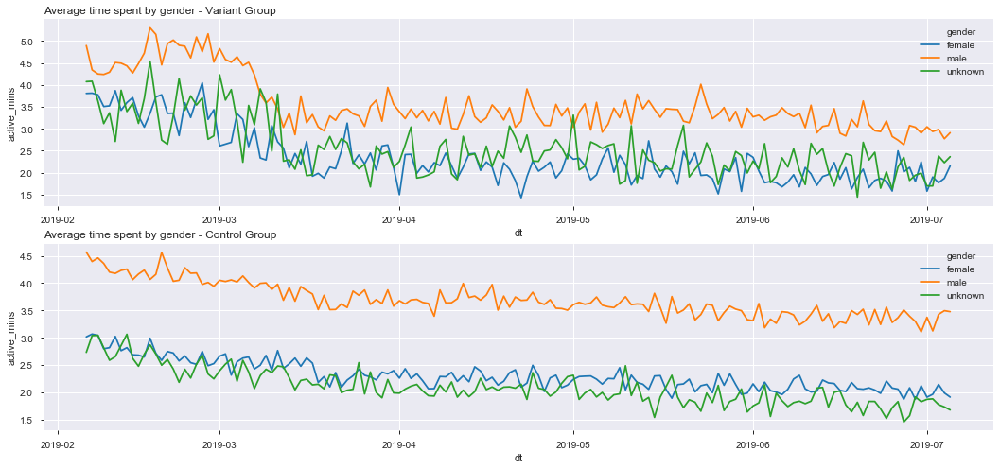

In [601]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Average time spent by gender - Variant Group',loc='left')
data=user_act_min_tc_f_atr[user_act_min_tc_f_atr.variant_number==1].groupby(['variant_number','gender','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='gender')
plt.subplot(2,1,2)
plt.title('Average time spent by gender - Control Group',loc='left')
data=user_act_min_tc_f_atr[user_act_min_tc_f_atr.variant_number==0].groupby(['variant_number','gender','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='gender')

There is a gradual decline in the average time spent across all gender types in both variant and control.However, the difference between male and the other two gender types is more pronounced in the control compared to the variant

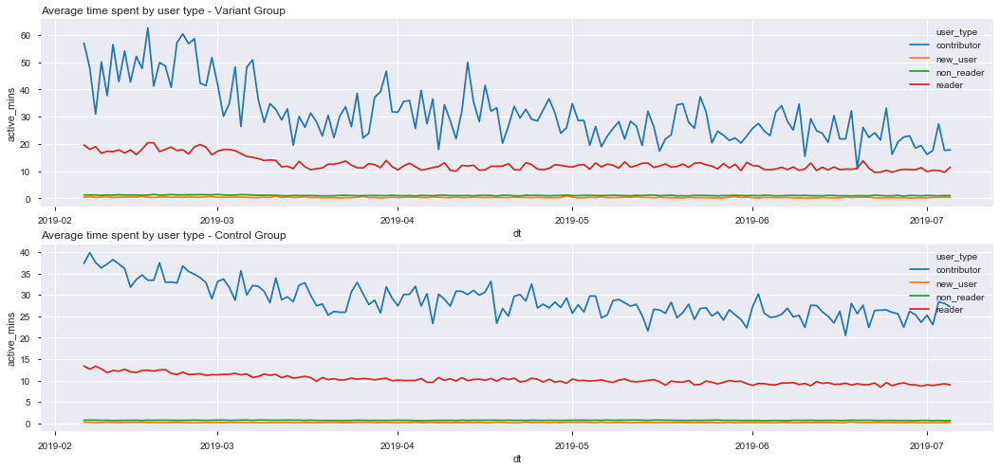

In [604]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Average time spent by user type - Variant Group',loc='left')
data=user_act_min_tc_f_atr[user_act_min_tc_f_atr.variant_number==1].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='user_type')
plt.subplot(2,1,2)
plt.title('Average time spent by user type - Control Group',loc='left')
data=user_act_min_tc_f_atr[user_act_min_tc_f_atr.variant_number==0].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='user_type')

There is a steady drop in the time spent by contributors and readers in both the test and the control groups,while the non-reader and new users have a contant trend close to 0.
The variation is higher in the test group compared to the control

In [579]:
user_act_min_tc_new_f_atr = user_act_min_tc_new_f.merge(t4_user_atrib, on='uid',how ='left')

In [581]:
user_act_min_tc_new_f_atr.shape

(5289450, 8)

In [582]:
user_act_min_tc_pre_new_f_atr = user_act_min_tc_pre_new_f.merge(t4_user_atrib, on='uid',how ='left')

In [583]:
user_act_min_tc_pre_new_f_atr.shape

(5289450, 8)

In [640]:
user_act_min_tc_pre_post = pd.concat([user_act_min_tc_pre_new_f_atr,user_act_min_tc_new_f_atr],ignore_index=True)

In [661]:
user_act_min_tc_pre_post.shape

(10578900, 8)

### Pre-post comparison by gender

Text(2019-02-06 00:00:00, 2, 'experiment')

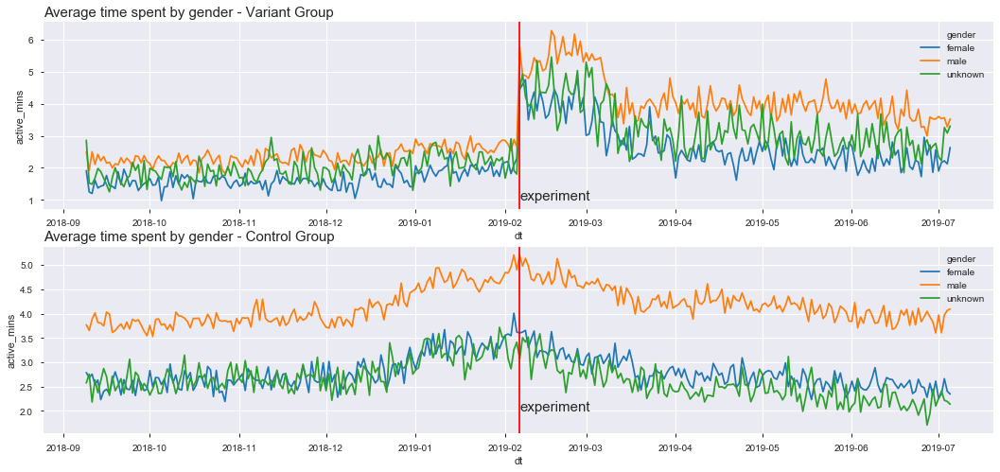

In [667]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Average time spent by gender - Variant Group',loc='left', fontsize=15)
data=user_act_min_tc_pre_post[user_act_min_tc_pre_post.variant_number==1].groupby(['variant_number','gender','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='gender')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=1,s ='experiment', fontsize =15)
plt.subplot(2,1,2)
plt.title('Average time spent by gender - Control Group',loc='left',fontsize=15)
data=user_act_min_tc_pre_post[user_act_min_tc_pre_post.variant_number==0].groupby(['variant_number','gender','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='gender')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=2,s ='experiment', fontsize =15)

### Pre-post comparison by user type

Text(2019-02-06 00:00:00, 0, 'experiment')

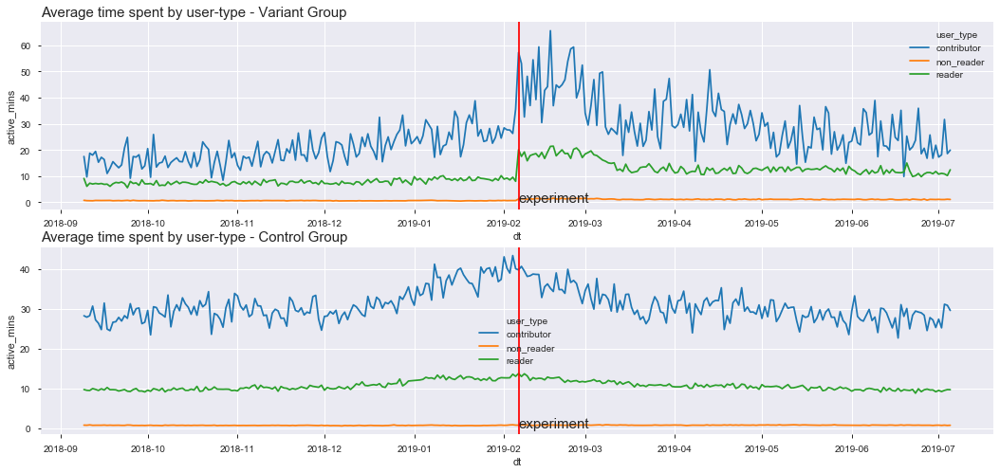

In [669]:
plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Average time spent by user-type - Variant Group',loc='left', fontsize =15)
data=user_act_min_tc_pre_post[user_act_min_tc_pre_post.variant_number==1].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='user_type')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=0,s ='experiment', fontsize =15)
plt.subplot(2,1,2)
plt.title('Average time spent by user-type - Control Group',loc='left', fontsize =15)
data=user_act_min_tc_pre_post[user_act_min_tc_pre_post.variant_number==0].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.mean()
sns.lineplot(data=data,x='dt',y='active_mins',hue='user_type')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=0,s ='experiment', fontsize =15)

### Performing Welch t-test by covariates

In [613]:
user_type = ['contributor','reader','non_reader','new_user']
for user in user_type:
    print(user)
    variant = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.variant_number==1) & (user_act_min_tc_f_atr.user_type==user)]
    variant_mean = variant.active_mins.mean()
    variant_std = variant.active_mins.std()
    variant_cnt = variant.active_mins.count()
    print('%.2f %.2f %.2f' %(variant_mean,variant_std, variant_cnt))

    control = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.variant_number==0) & (user_act_min_tc_f_atr.user_type==user)]
    control_mean = control.active_mins.mean()
    control_std = control.active_mins.std()
    control_cnt = control.active_mins.count()
    print('%.2f %.2f %.2f' %(control_mean,control_std, control_cnt))

    print('T-test for user_type - %s' %user)
    print(ttest_ind_from_stats(mean1=variant_mean,std1=variant_std,nobs1=variant_cnt,
                    mean2=control_mean,std2=control_std,nobs2=control_cnt,
                    equal_var=False))

contributor
31.39 90.57 19050.00
28.73 73.61 136650.00
T-test for user_type - contributor
Ttest_indResult(statistic=3.870975088166304, pvalue=0.00010870434866807054)
reader
12.84 42.89 189000.00
10.25 32.17 1002750.00
T-test for user_type - reader
Ttest_indResult(statistic=25.035617498477883, pvalue=3.8354014199145715e-138)
non_reader
1.10 8.08 1051950.00
0.70 5.18 4118400.00
T-test for user_type - non_reader
Ttest_indResult(statistic=47.88210022318697, pvalue=0.0)
new_user
0.35 4.41 121200.00
0.19 2.78 355950.00
T-test for user_type - new_user
Ttest_indResult(statistic=11.984496555397515, pvalue=4.431041042148054e-33)


In [614]:
gender = ['male','female','unknown']
for user in gender:
    print(user)
    variant = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.variant_number==1) & (user_act_min_tc_f_atr.gender==user)]
    variant_mean = variant.active_mins.mean()
    variant_std = variant.active_mins.std()
    variant_cnt = variant.active_mins.count()
    print('%.2f %.2f %.2f' %(variant_mean,variant_std, variant_cnt))

    control = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.variant_number==0) & (user_act_min_tc_f_atr.gender==user)]
    control_mean = control.active_mins.mean()
    control_std = control.active_mins.std()
    control_cnt = control.active_mins.count()
    print('%.2f %.2f %.2f' %(control_mean,control_std, control_cnt))

    print('T-test for gender - %s' %user)
    print(ttest_ind_from_stats(mean1=variant_mean,std1=variant_std,nobs1=variant_cnt,
                    mean2=control_mean,std2=control_std,nobs2=control_cnt,
                    equal_var=False))

male
3.56 23.21 770400.00
3.69 21.51 3150900.00
T-test for gender - male
Ttest_indResult(statistic=-4.769656497983092, pvalue=1.8456357946949837e-06)
female
2.35 17.45 391800.00
2.31 15.80 1610250.00
T-test for gender - female
Ttest_indResult(statistic=1.4767232183867225, pvalue=0.13975040966281485)
unknown
2.56 18.93 219000.00
2.10 15.17 852600.00
T-test for gender - unknown
Ttest_indResult(statistic=10.407906213597437, pvalue=2.305060036659807e-25)


In [623]:
gender = ['male','female','unknown']
for user in gender:
    print(user)
    variant = user_act_min_tc_new_f_atr[(user_act_min_tc_new_f_atr.variant_number==1) & (user_act_min_tc_new_f_atr.gender==user)]
    variant_mean = variant.active_mins.mean()
    variant_std = variant.active_mins.std()
    variant_cnt = variant.active_mins.count()
    print('%.2f %.2f %.2f' %(variant_mean,variant_std, variant_cnt))

    control = user_act_min_tc_new_f_atr[(user_act_min_tc_new_f_atr.variant_number==0) & (user_act_min_tc_new_f_atr.gender==user)]
    control_mean = control.active_mins.mean()
    control_std = control.active_mins.std()
    control_cnt = control.active_mins.count()
    print('%.2f %.2f %.2f' %(control_mean,control_std, control_cnt))

    print('T-test for gender - %s' %user)
    print(ttest_ind_from_stats(mean1=variant_mean,std1=variant_std,nobs1=variant_cnt,
                    mean2=control_mean,std2=control_std,nobs2=control_cnt,
                    equal_var=False))

male
4.20 25.56 597750.00
4.25 23.22 2491800.00
T-test for gender - male
Ttest_indResult(statistic=-1.227076135335134, pvalue=0.2197943164527481)
female
2.73 17.67 274650.00
2.78 17.46 1176300.00
T-test for gender - female
Ttest_indResult(statistic=-1.1047385232940732, pvalue=0.2692735552724988)
unknown
3.23 20.40 149550.00
2.51 16.17 599400.00
T-test for gender - unknown
Ttest_indResult(statistic=12.632526827107078, pvalue=1.4431917486332137e-36)


From the above test results, it can be observed that at a user-type level, the overall treatment effect is significant between the groups, however, at a gender level, the treatment effect is not significant

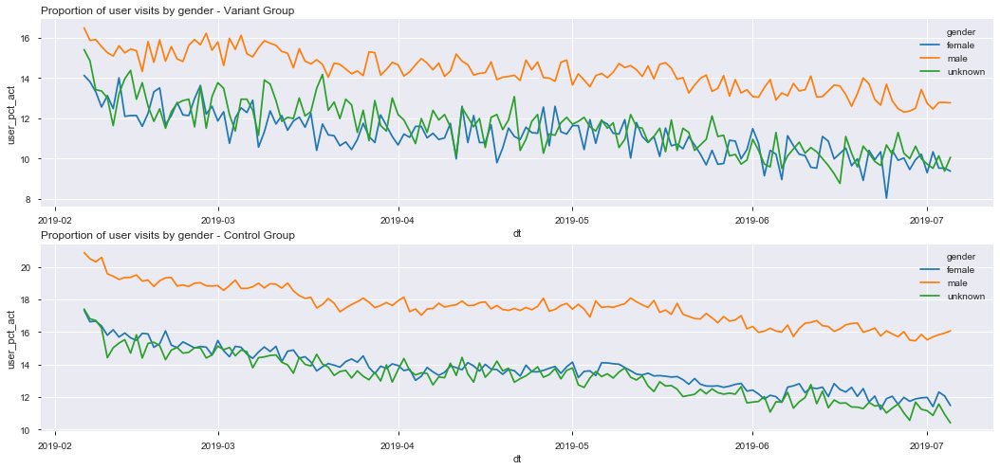

In [636]:
user_cnt_act = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.active_mins >0) ].groupby(['variant_number','gender','dt'],as_index=False).active_mins.count()
user_cnt_all = user_act_min_tc_f_atr.groupby(['variant_number','gender','dt'],as_index=False).active_mins.count()
user_cnt_merge = user_cnt_act.merge(user_cnt_all, on=['variant_number','gender','dt'],how = 'inner')
user_cnt_merge['user_pct_act'] = round(user_cnt_merge.active_mins_x*100/user_cnt_merge.active_mins_y,2)

plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Proportion of user visits by gender - Variant Group',loc='left')
data=user_cnt_merge[(user_cnt_merge.variant_number==1)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='gender')
plt.subplot(2,1,2)
plt.title('Proportion of user visits by gender - Control Group',loc='left')
data=user_cnt_merge[(user_cnt_merge.variant_number==0)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='gender')

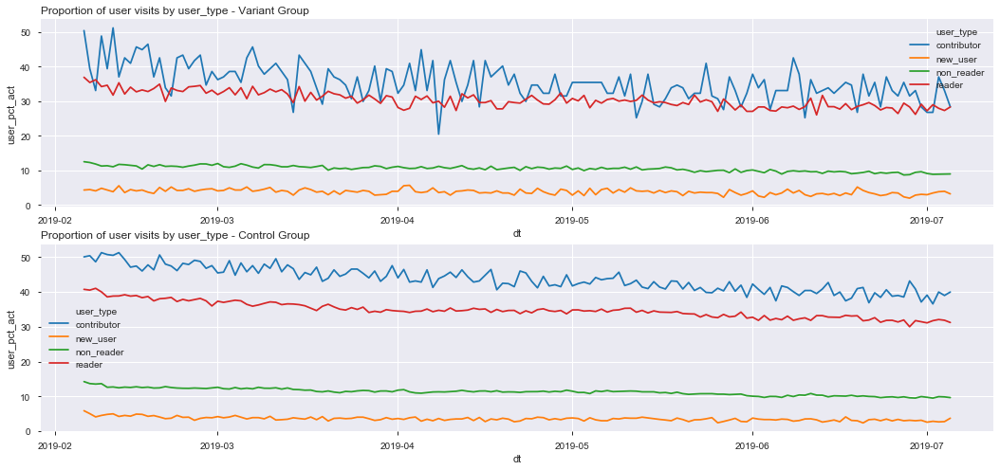

In [637]:
user_cnt_act = user_act_min_tc_f_atr[(user_act_min_tc_f_atr.active_mins >0) ].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.count()
user_cnt_all = user_act_min_tc_f_atr.groupby(['variant_number','user_type','dt'],as_index=False).active_mins.count()
user_cnt_merge = user_cnt_act.merge(user_cnt_all, on=['variant_number','user_type','dt'],how = 'inner')
user_cnt_merge['user_pct_act'] = round(user_cnt_merge.active_mins_x*100/user_cnt_merge.active_mins_y,2)

plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Proportion of user visits by user_type - Variant Group',loc='left')
data=user_cnt_merge[(user_cnt_merge.variant_number==1)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='user_type')
plt.subplot(2,1,2)
plt.title('Proportion of user visits by user_type - Control Group',loc='left')
data=user_cnt_merge[(user_cnt_merge.variant_number==0)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='user_type')

Text(2019-02-06 00:00:00, 12, 'experiment')

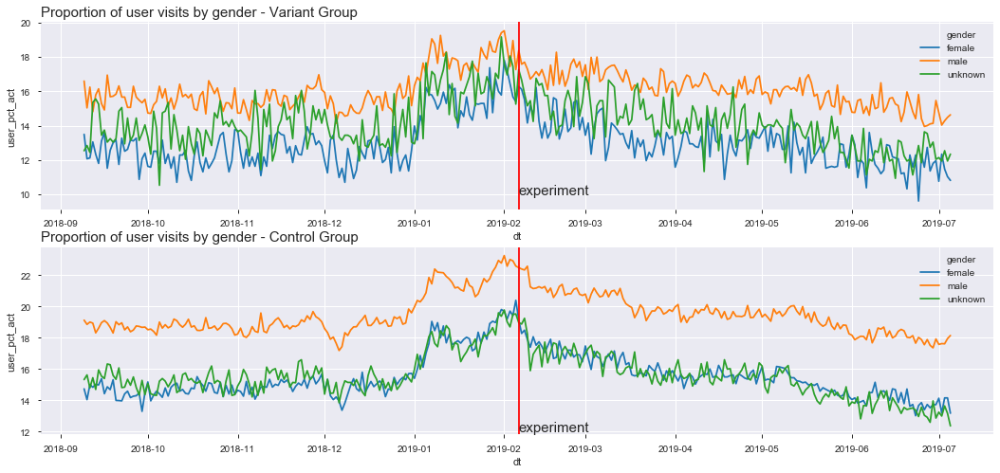

In [668]:
user_cnt_act = user_act_min_tc_pre_post[(user_act_min_tc_pre_post.active_mins >0) ].groupby(['variant_number','gender','dt'],as_index=False).active_mins.count()
user_cnt_all = user_act_min_tc_pre_post.groupby(['variant_number','gender','dt'],as_index=False).active_mins.count()
user_cnt_merge = user_cnt_act.merge(user_cnt_all, on=['variant_number','gender','dt'],how = 'inner')
user_cnt_merge['user_pct_act'] = round(user_cnt_merge.active_mins_x*100/user_cnt_merge.active_mins_y,2)

plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Proportion of user visits by gender - Variant Group',loc='left',fontsize =15)
data=user_cnt_merge[(user_cnt_merge.variant_number==1)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='gender')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=10,s ='experiment', fontsize =15)
plt.subplot(2,1,2)
plt.title('Proportion of user visits by gender - Control Group',loc='left',fontsize =15)
data=user_cnt_merge[(user_cnt_merge.variant_number==0)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='gender')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=12,s ='experiment', fontsize =15)

Text(2019-02-06 00:00:00, 10, 'experiment')

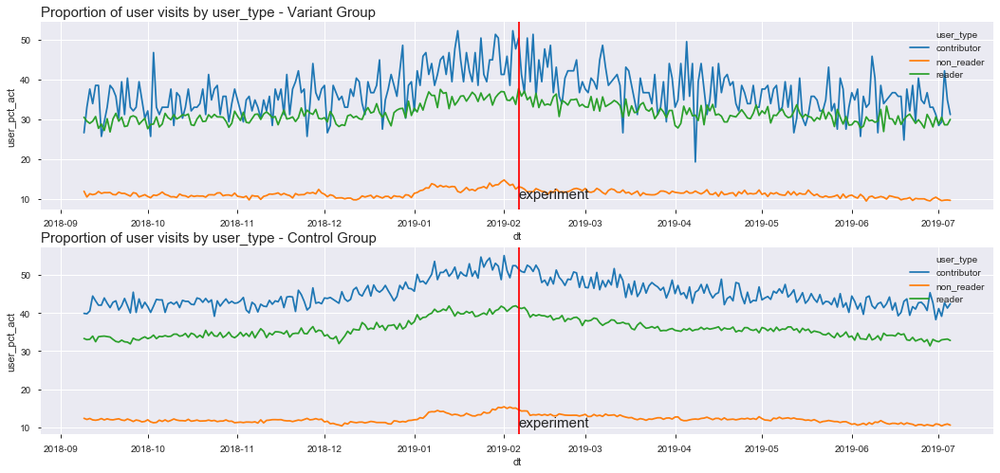

In [670]:
user_cnt_act = user_act_min_tc_pre_post[(user_act_min_tc_pre_post.active_mins >0) ].groupby(['variant_number','user_type','dt'],as_index=False).active_mins.count()
user_cnt_all = user_act_min_tc_pre_post.groupby(['variant_number','user_type','dt'],as_index=False).active_mins.count()
user_cnt_merge = user_cnt_act.merge(user_cnt_all, on=['variant_number','user_type','dt'],how = 'inner')
user_cnt_merge['user_pct_act'] = round(user_cnt_merge.active_mins_x*100/user_cnt_merge.active_mins_y,2)

plt.figure(figsize=(18,8))
plt.subplot(2,1,1)
plt.title('Proportion of user visits by user_type - Variant Group',loc='left', fontsize =15)
data=user_cnt_merge[(user_cnt_merge.variant_number==1)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='user_type')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=10,s ='experiment', fontsize =15)
plt.subplot(2,1,2)
plt.title('Proportion of user visits by user_type - Control Group',loc='left', fontsize =15)
data=user_cnt_merge[(user_cnt_merge.variant_number==0)]
sns.lineplot(data=data,x='dt',y='user_pct_act',hue='user_type')
plt.axvline(x = user_act_min_tc_pre_post.start_dt.max(), color = 'red')
plt.text(x = user_act_min_tc_pre_post.start_dt.max(),y=10,s ='experiment', fontsize =15)